<a href="https://colab.research.google.com/github/ritwiks9635/Generative_Model/blob/main/Image_Super_Resolution_using_ESPCN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**💫🌜Image Super-Resolution using an Efficient Sub-Pixel CNN🌛💫**

[BSDS500](https://www.kaggle.com/datasets/balraj98/berkeley-segmentation-dataset-500-bsds500)

In [ ]:
!unzip /content/https:/www.kaggle.com/datasets/balraj98/berkeley-segmentation-dataset-500-bsds500/berkeley-segmentation-dataset-500-bsds500.zip

In [ ]:
!pip install keras --upgrade

In [4]:
import math
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import ops
from tensorflow.keras import layers
from tensorflow.keras.utils import load_img, img_to_array, array_to_img

from IPython.display import display
import matplotlib.pyplot as plt

In [6]:
data_dir = "/content/images"

In [7]:
crop_size = 300
upscale_factor = 3
input_size = crop_size // upscale_factor
batch_size = 4

train_dataset = keras.preprocessing.image_dataset_from_directory(
    data_dir,
    batch_size = batch_size,
    image_size = (crop_size, crop_size),
    validation_split = 0.2,
    subset = "training",
    seed = 1337,
    label_mode = None)


valid_dataset = keras.preprocessing.image_dataset_from_directory(
    data_dir,
    batch_size = batch_size,
    image_size = (crop_size, crop_size),
    validation_split = 0.2,
    subset = "validation",
    seed = 1337,
    label_mode = None)

Found 500 files.
Using 400 files for training.
Found 500 files.
Using 100 files for validation.


In [8]:
test_dir = os.path.join(data_dir, "test")
test_img_path = sorted(
    [
        os.path.join(test_dir, img)
        for img in os.listdir(test_dir)
        if img.endswith(".jpg")
    ])
print(len(test_img_path))

200


In [9]:
def scaling(image):
    image = image / 255.0
    return image


train_dataset = train_dataset.map(scaling)
valid_dataset = valid_dataset.map(scaling)

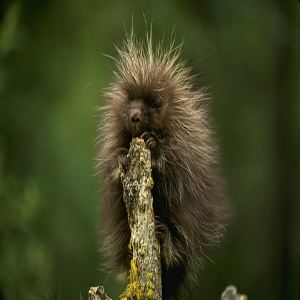

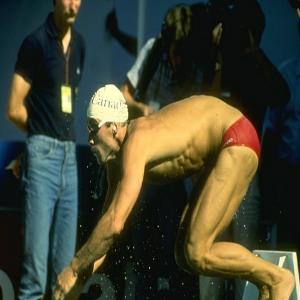

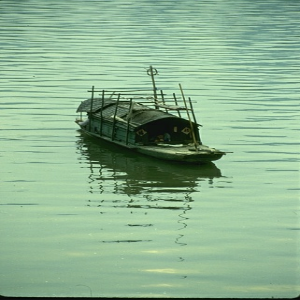

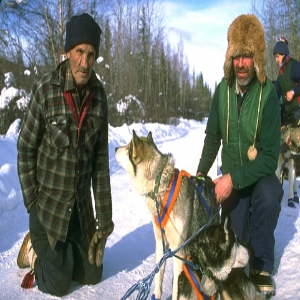

In [10]:
for batch in train_dataset.take(1):
    for img in batch:
        display(array_to_img(img))


First, we convert our images from the RGB color space to the [YUV colour space](https://en.wikipedia.org/wiki/YUV).

For the input data (low-resolution images), we crop the image, retrieve the y channel (luninance), and resize it with the area method (use BICUBIC if you use PIL). We only consider the luminance channel in the YUV color space because humans are more sensitive to luminance change.
For the target data (high-resolution images), we just crop the image and retrieve the y channel.

In [11]:
def process_input(input, input_size):
    input = tf.image.rgb_to_yuv(input)
    last_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis = last_axis)
    return tf.image.resize(y, [input_size, input_size], method = "area")


def process_target(input):
    input = tf.image.rgb_to_yuv(input)
    last_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis = last_axis)
    return y


train_dataset = train_dataset.map(
    lambda x : (process_input(x, input_size), process_target(x)))
train_dataset = train_dataset.prefetch(buffer_size = 32)


valid_dataset = valid_dataset.map(
    lambda x : (process_input(x, input_size), process_target(x)))
valid_dataset = valid_dataset.prefetch(buffer_size = 32)

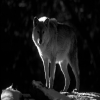

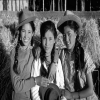

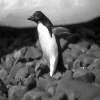

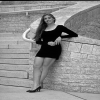

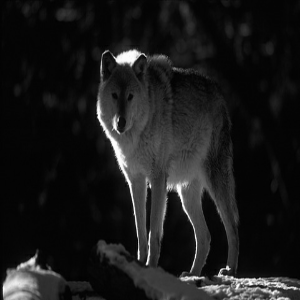

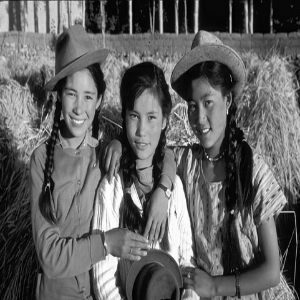

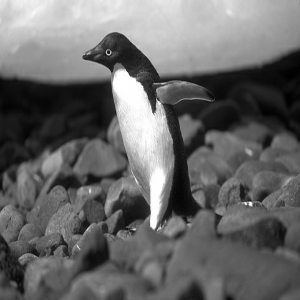

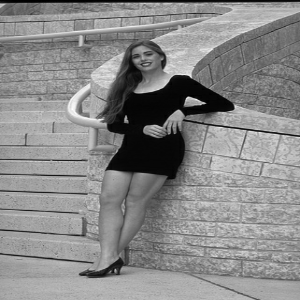

In [12]:
for batch in train_dataset.take(1):
    for img in batch[0]:
        display(array_to_img(img))

    for img in batch[1]:
        display(array_to_img(img))

###**🌟Build Model🌟**

In [13]:
class DepthToSpace(layers.Layer):
    def __init__(self, block_size):
        super().__init__()
        self.block_size = block_size

    def call(self, input):
        batch, height, width, depth = ops.shape(input)
        depth = depth // (self.block_size ** 2)
        x = ops.reshape(input, [batch, height,  width,  self.block_size, self.block_size, depth])
        x = ops.transpose(x, [0, 1, 3, 2, 4, 5])
        x = ops.reshape(x, [batch, height * self.block_size, width * self.block_size, depth])
        return x


def build_model(upscale_factor = 3, channels = 1):
    config = {
        "padding" : "same",
        "activation" : "relu",
        "kernel_initializer" : "orthogonal"}

    inputs = keras.Input(shape = (None, None, channels))
    x = layers.Conv2D(64, 5, **config)(inputs)
    x = layers.Conv2D(64, 3, **config)(x)
    x = layers.Conv2D(32, 3, **config)(x)
    x = layers.Conv2D(channels * (upscale_factor ** 2), 3, **config)(x)
    outputs = DepthToSpace(upscale_factor)(x)
    return keras.Model(inputs, outputs)

###**Build Callbacks**

In [14]:
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL


def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 100, 200
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()


def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
        (img.size[0] // upscale_factor, img.size[1] // upscale_factor),
        PIL.Image.BICUBIC,
    )


def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0

    input = np.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert(
        "RGB"
    )
    return out_img

In [15]:
class ESPCNCallback(keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        self.test_img = get_lowres_image(load_img(test_img_path[0]), upscale_factor)

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []

    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        if epoch % 20 == 0:
            prediction = upscale_image(self.model, self.test_img)
            plot_results(prediction, "epoch-" + str(epoch), "prediction")

    def on_test_batch_end(self, batch, logs=None):
        self.psnr.append(10 * math.log10(1 / logs["loss"]))

In [16]:
early_stopping_cb = keras.callbacks.EarlyStopping(monitor = "loss", patience = 10)

checkpoint_path = "my_model.weights.h5"
model_checkpoint = keras.callbacks.ModelCheckpoint(
    checkpoint_path,
    monitor = "loss",
    mode = "min",
    save_best_only = True,
    save_weights_only = True)

callbacks = [early_stopping_cb, model_checkpoint, ESPCNCallback()]

model = build_model(upscale_factor, channels = 1)
model.compile(
    optimizer = keras.optimizers.Adam(learning_rate = 0.001),
    loss = keras.losses.MeanSquaredError())

model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, None, None, 1)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, None, None, 64)      │           1,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, None, None, 64)      │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, None, None, 32)      │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, None, None, 9)       │           2,601 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ depth_to_space (DepthToSpace)        │ (None, None, None, 1)       │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 59,657 (233.04 KB)

 Trainable params: 59,657 (233.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
 97/100 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0569Mean PSNR for epoch: 24.11
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 984ms/step


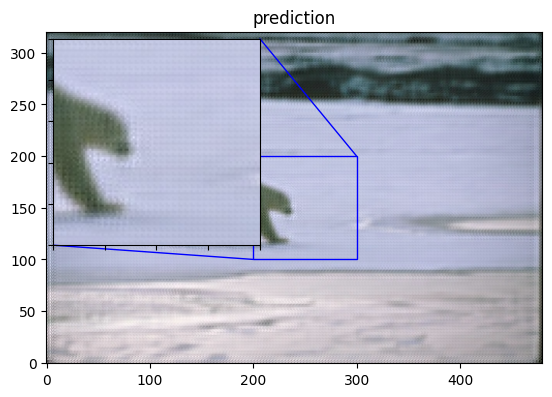

100/100 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.0556 - val_loss: 0.0040
Epoch 2/200
 96/100 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0040Mean PSNR for epoch: 25.74
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0040 - val_loss: 0.0027
Epoch 3/200
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0032Mean PSNR for epoch: 25.88
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0032 - val_loss: 0.0026
Epoch 4/200
 98/100 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0030Mean PSNR for epoch: 26.42
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 5/200
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0029Mean PSNR for epoch: 26.32
100/100 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 6/200
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0030Mean PSNR for epoch: 26.27
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0030 - val_loss: 0.0024
Epoch 7/200
 99/100 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0029

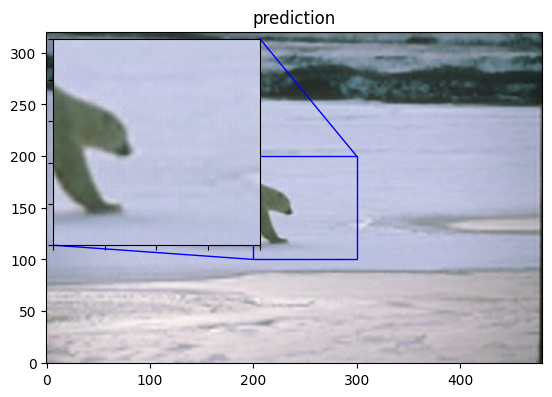

100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 22/200
 97/100 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0026Mean PSNR for epoch: 26.77
100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 23/200
 95/100 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0026Mean PSNR for epoch: 26.91
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 24/200
 96/100 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0028Mean PSNR for epoch: 26.37
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 25/200
 98/100 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0027Mean PSNR for epoch: 26.68
100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 26/200
 96/100 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0026Mean PSNR for epoch: 26.71
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 27/200
 97/100 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0

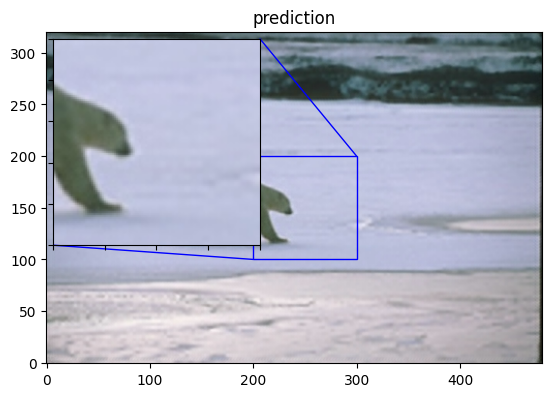

100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 42/200
 97/100 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0026Mean PSNR for epoch: 27.01
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 43/200
 96/100 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0026Mean PSNR for epoch: 26.71
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 44/200
 98/100 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0026Mean PSNR for epoch: 26.87
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 45/200
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0027Mean PSNR for epoch: 23.69
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0027 - val_loss: 0.0043
Epoch 46/200
 96/100 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0035Mean PSNR for epoch: 26.74
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0035 - val_loss: 0.0022
Epoch 47/200
 97/100 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0

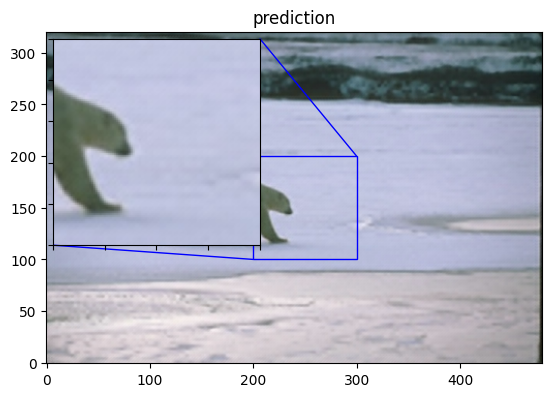

100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 62/200
 98/100 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0025Mean PSNR for epoch: 26.50
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 63/200
 99/100 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0027Mean PSNR for epoch: 26.52
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 64/200
 99/100 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0026Mean PSNR for epoch: 26.70
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 65/200
 98/100 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0026Mean PSNR for epoch: 26.90
100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 66/200
 96/100 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0026Mean PSNR for epoch: 26.94
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 67/200
 96/100 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0

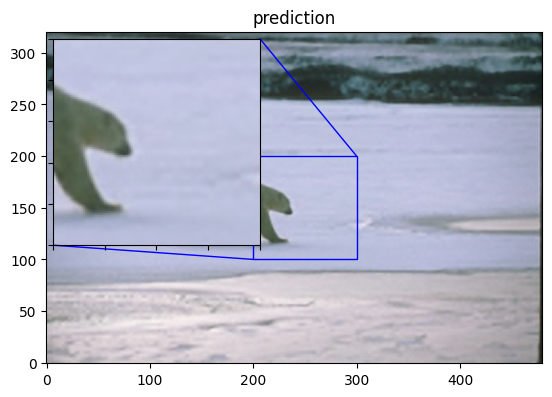

100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 82/200
 97/100 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0026Mean PSNR for epoch: 27.07
100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 83/200
 98/100 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0024Mean PSNR for epoch: 27.14
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0024 - val_loss: 0.0022
Epoch 84/200
 97/100 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0025Mean PSNR for epoch: 26.96
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 85/200
 99/100 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0026Mean PSNR for epoch: 26.90
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 86/200
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0025Mean PSNR for epoch: 26.92
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 87/200
 97/100 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0

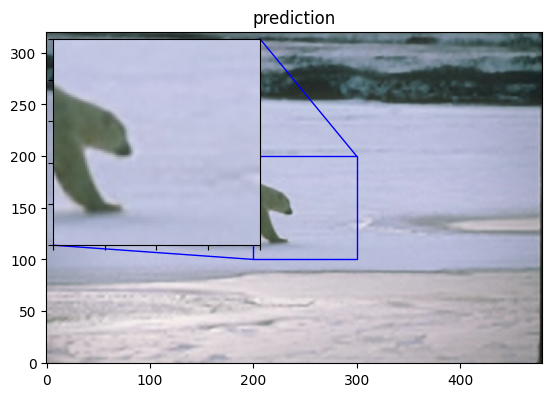

100/100 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.0024 - val_loss: 0.0022
Epoch 102/200
 98/100 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0025Mean PSNR for epoch: 27.10
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 103/200
 99/100 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0025Mean PSNR for epoch: 26.92
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 104/200
 99/100 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0025Mean PSNR for epoch: 26.64
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 105/200
 98/100 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0024Mean PSNR for epoch: 26.76
100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0024 - val_loss: 0.0022
Epoch 106/200
 97/100 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0025Mean PSNR for epoch: 26.87
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 107/200
 98/100 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - l

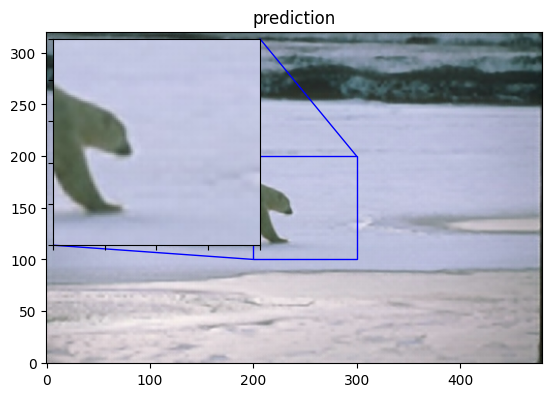

100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 122/200
 98/100 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0024Mean PSNR for epoch: 27.32
100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0024 - val_loss: 0.0022
Epoch 123/200
 97/100 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0025Mean PSNR for epoch: 26.86
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 124/200
 99/100 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0025Mean PSNR for epoch: 26.59
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 125/200
 98/100 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0025Mean PSNR for epoch: 26.84
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 126/200
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0025Mean PSNR for epoch: 27.01
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 127/200
 96/100 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - l

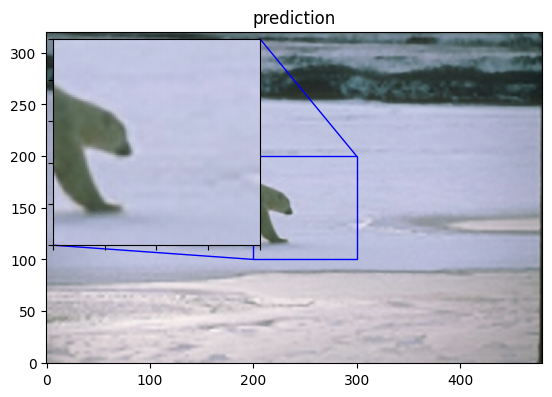

100/100 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.0024 - val_loss: 0.0022
Epoch 142/200
 97/100 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0025Mean PSNR for epoch: 26.88
100/100 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 143/200
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0024Mean PSNR for epoch: 26.84
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0024 - val_loss: 0.0022
Epoch 144/200
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0025Mean PSNR for epoch: 27.19
100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 145/200
 97/100 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0024Mean PSNR for epoch: 27.16
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0024 - val_loss: 0.0022
Epoch 146/200
 97/100 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0025Mean PSNR for epoch: 26.92
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 147/200
 98/100 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - l

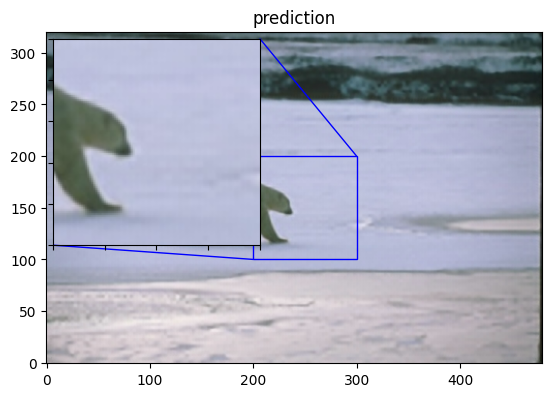

100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 162/200
 99/100 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0024Mean PSNR for epoch: 27.20
100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0024 - val_loss: 0.0022
Epoch 163/200
 98/100 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0024Mean PSNR for epoch: 26.98
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0024 - val_loss: 0.0022
Epoch 164/200
 97/100 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0024Mean PSNR for epoch: 27.16
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0024 - val_loss: 0.0022
Epoch 165/200
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0024Mean PSNR for epoch: 26.96
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0024 - val_loss: 0.0022
Epoch 166/200
 99/100 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0024Mean PSNR for epoch: 26.61
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 167/200
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - l

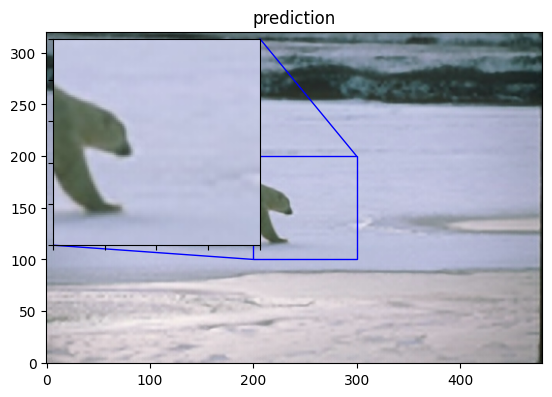

100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0024 - val_loss: 0.0022
Epoch 182/200
 97/100 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0024Mean PSNR for epoch: 27.05
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0024 - val_loss: 0.0022
Epoch 183/200
 97/100 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0024Mean PSNR for epoch: 26.66
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0024 - val_loss: 0.0022
Epoch 184/200
 98/100 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0024Mean PSNR for epoch: 26.91
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0024 - val_loss: 0.0022
Epoch 185/200
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0025Mean PSNR for epoch: 27.06
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 186/200
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0024Mean PSNR for epoch: 26.88
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0024 - val_loss: 0.0022
Epoch 187/200
 97/100 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - l

In [17]:
model.fit(
    train_dataset,
    validation_data = valid_dataset,
    epochs = 200,
    callbacks = callbacks)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
PSNR of low resolution image and high resolution image is 30.0157
PSNR of predict and high resolution is 30.9191


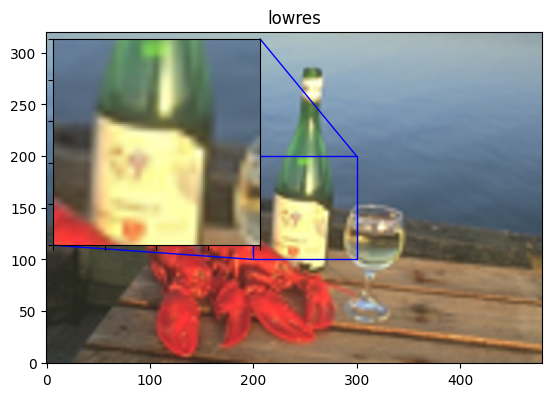

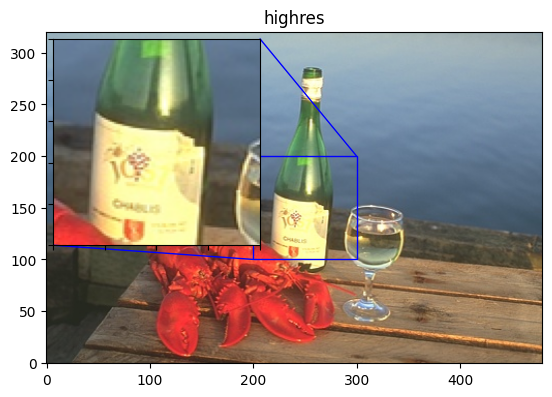

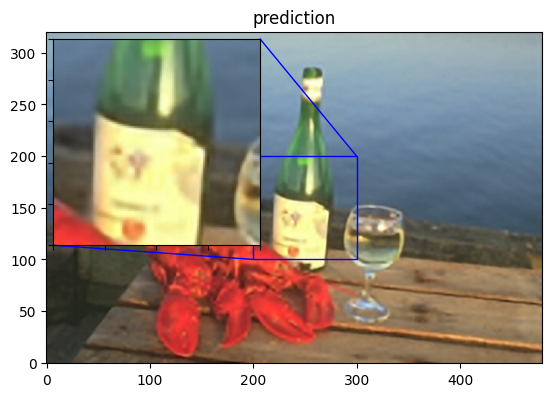

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
PSNR of low resolution image and high resolution image is 25.1103
PSNR of predict and high resolution is 26.3200


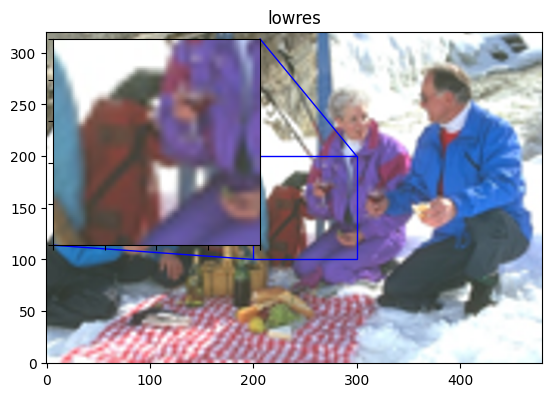

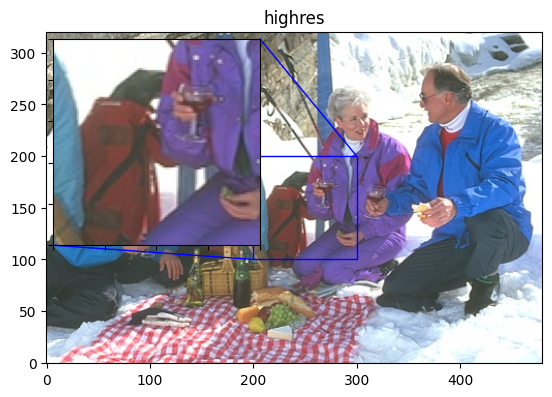

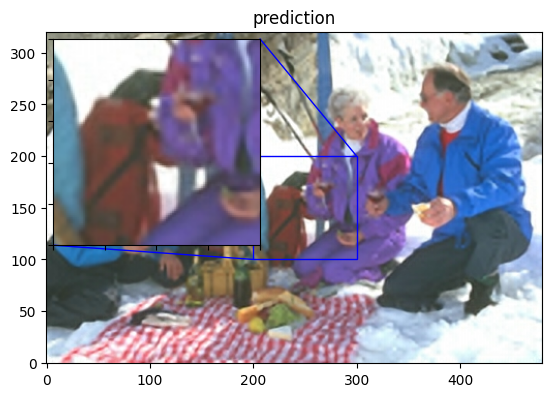

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
PSNR of low resolution image and high resolution image is 27.7789
PSNR of predict and high resolution is 28.5053


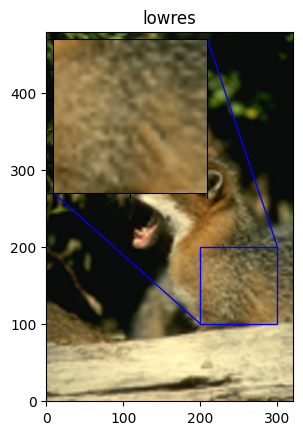

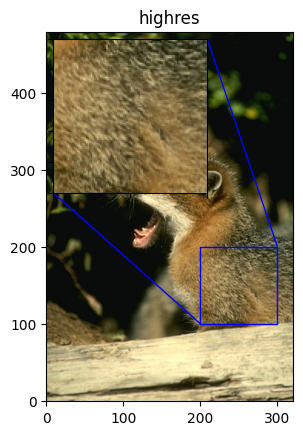

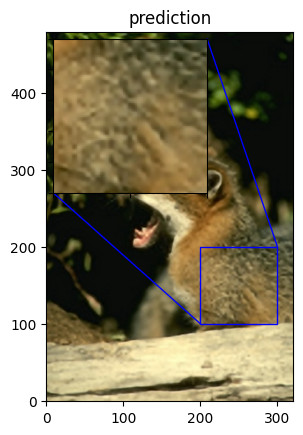

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
PSNR of low resolution image and high resolution image is 28.0321
PSNR of predict and high resolution is 28.3104


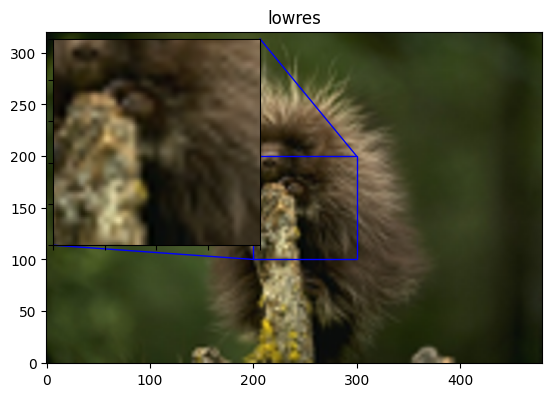

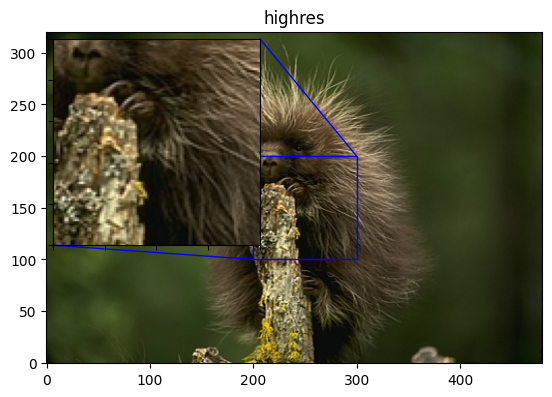

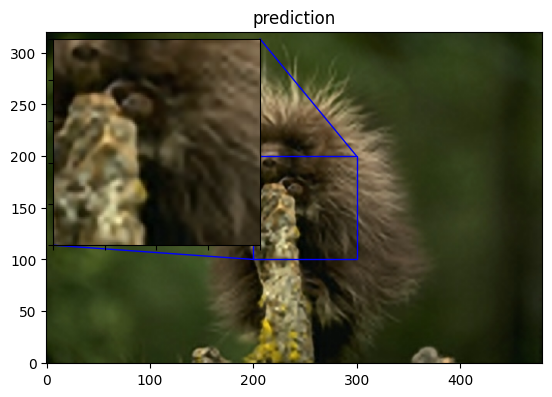

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
PSNR of low resolution image and high resolution image is 25.7853
PSNR of predict and high resolution is 26.4446


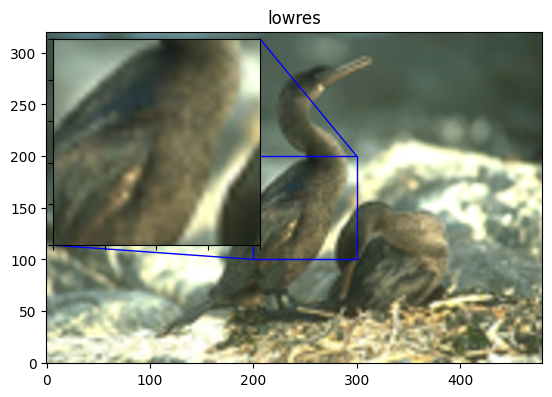

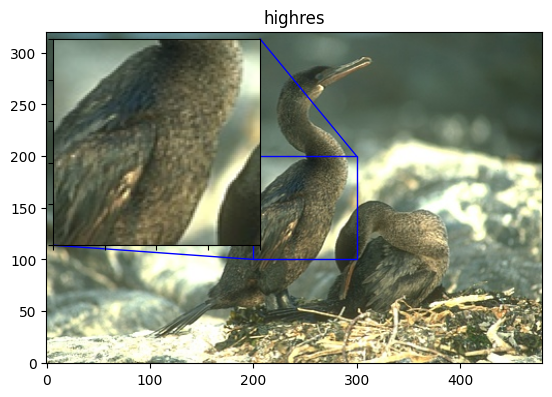

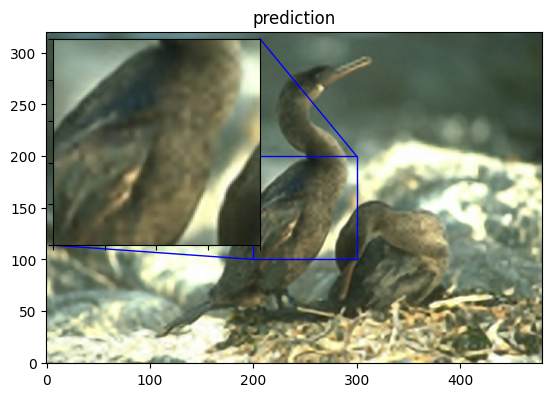

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
PSNR of low resolution image and high resolution image is 25.9181
PSNR of predict and high resolution is 26.9081


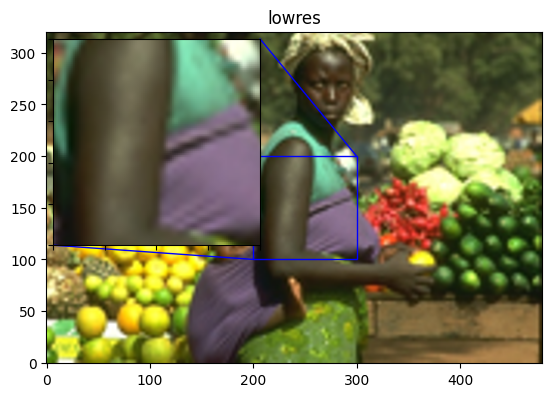

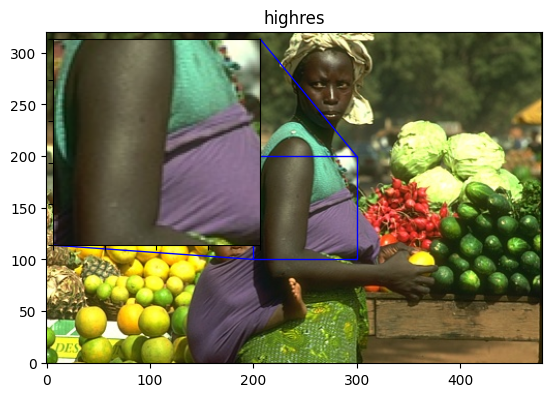

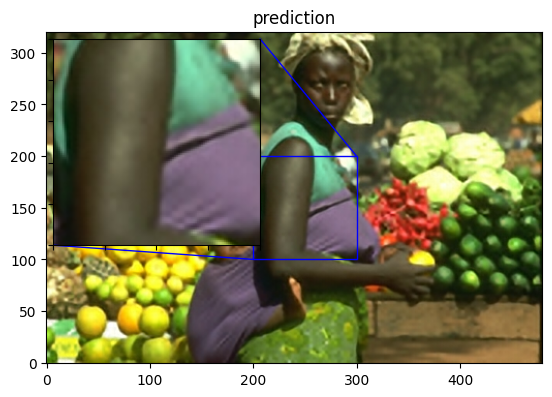

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
PSNR of low resolution image and high resolution image is 26.2389
PSNR of predict and high resolution is 27.2079


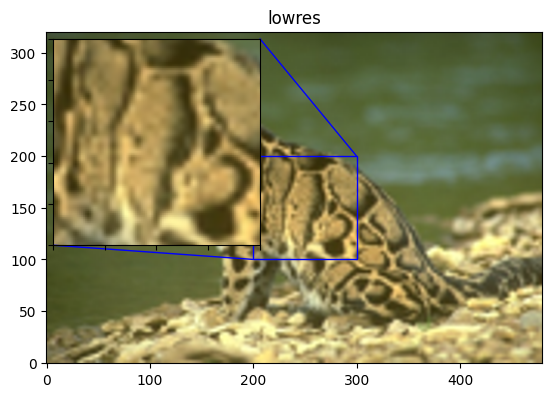

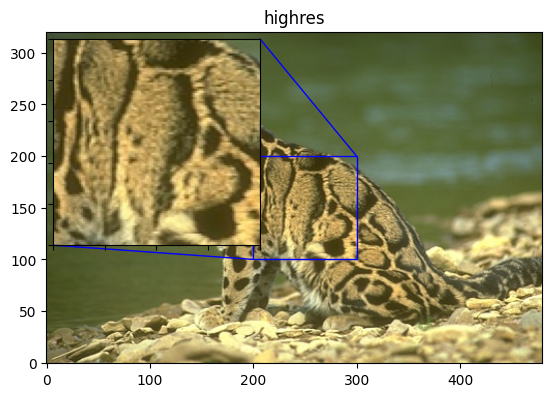

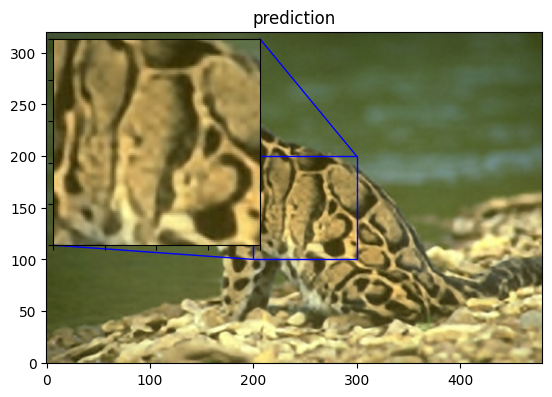

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
PSNR of low resolution image and high resolution image is 23.3281
PSNR of predict and high resolution is 24.9805


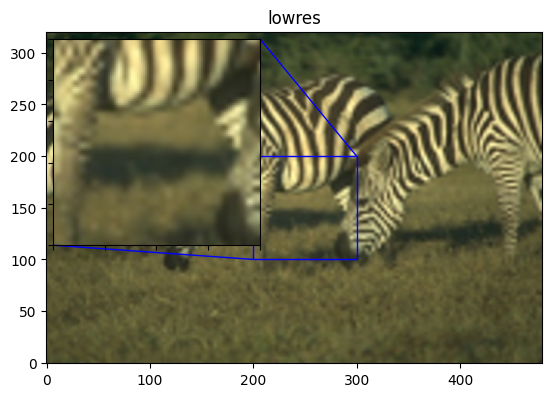

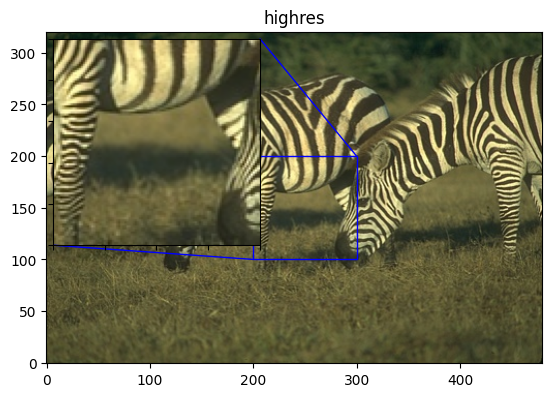

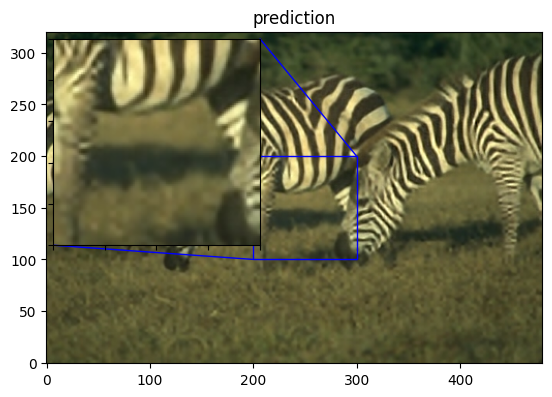

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
PSNR of low resolution image and high resolution image is 29.9008
PSNR of predict and high resolution is 30.1203


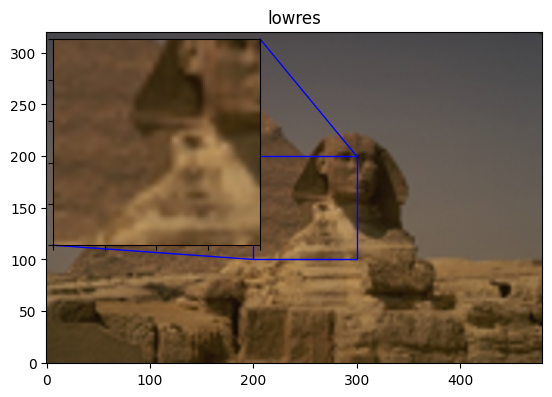

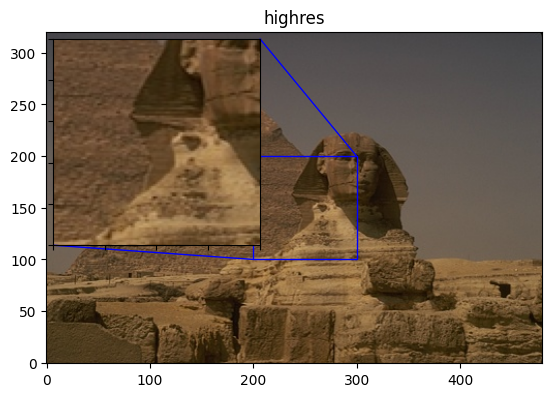

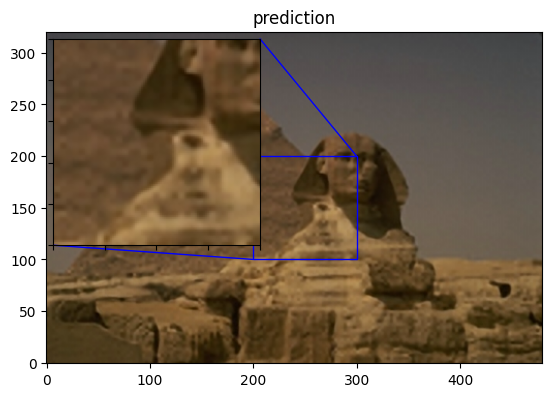

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
PSNR of low resolution image and high resolution image is 25.2492
PSNR of predict and high resolution is 25.8425


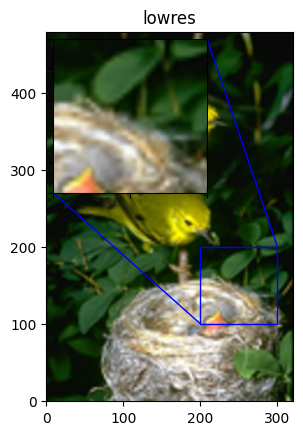

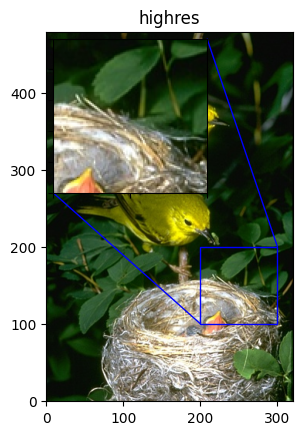

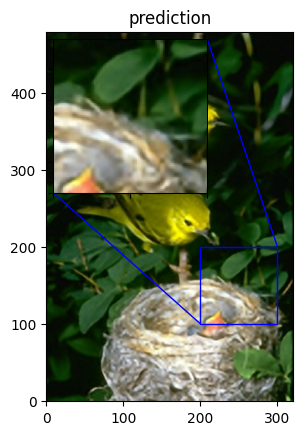

Avg. PSNR of lowres images is 26.7357
Avg. PSNR of reconstructions is 27.5559


In [18]:
model.load_weights(checkpoint_path)


total_bicubic_psnr = 0.0
total_test_psnr = 0.0

for index, test_img in enumerate(test_img_path[50:60]):
    img = load_img(test_img)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    prediction = upscale_image(model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))